In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/predict-concrete-strength/ConcreteStrengthData.csv
/kaggle/input/playground-series-s3e9/sample_submission.csv
/kaggle/input/playground-series-s3e9/train.csv
/kaggle/input/playground-series-s3e9/test.csv


In [2]:
!pip install autoviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7/64.7 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 29.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 53.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 57.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 57.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 56.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 62.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 60.4 MB/s eta 0:00:00
  Attempting uninstall: panel
    Found existing installation: panel 0.14.3
    Uninstalling panel-0.14.3:
      Successfully uninstalled panel-0.14.3
  Attempting uninstall: holoviews
    Found existing in

# 1. Importing Libraries

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt 
from scipy import stats
from autoviz import data_cleaning_suggestions
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import mutual_info_regression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold 


Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


# 2. Read Data


In [4]:
train = pd.read_csv('/kaggle/input/playground-series-s3e9/train.csv')
train = train.drop('id' ,axis = 1)
test = pd.read_csv('/kaggle/input/playground-series-s3e9/test.csv')
test = test.drop('id' ,axis = 1)

In [5]:
train.head()

,CementComponent,BlastFurnaceSlag,FlyAshComponent,WaterComponent,SuperplasticizerComponent,CoarseAggregateComponent,FineAggregateComponent,AgeInDays,Strength
0,525.0,0.0,0.0,186.0,0.0,1125.0,613.0,3,10.38
1,143.0,169.0,143.0,191.0,8.0,967.0,643.0,28,23.52
2,289.0,134.7,0.0,185.7,0.0,1075.0,795.3,28,36.96
3,304.0,76.0,0.0,228.0,0.0,932.0,670.0,365,39.05
4,157.0,236.0,0.0,192.0,0.0,935.4,781.2,90,74.19


# 3. Summary of Data

In [6]:
data_cleaning_suggestions(train)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Strength,843,float64,0,0.000000,15.590901,0,
FineAggregateComponent,376,float64,0,0.000000,6.953949,0,
CoarseAggregateComponent,342,float64,0,0.000000,6.325134,0,
CementComponent,314,float64,0,0.000000,5.807287,0,
BlastFurnaceSlag,224,float64,0,0.000000,4.142778,0,skewed: cap or drop outliers
WaterComponent,215,float64,0,0.000000,3.976327,0,
FlyAshComponent,177,float64,0,0.000000,3.273534,0,skewed: cap or drop outliers
SuperplasticizerComponent,112,float64,0,0.000000,2.071389,0,skewed: cap or drop outliers
AgeInDays,15,int64,0,0.000000,0.277418,0,


# 4. Checking null

In [7]:
train.isna().sum()

CementComponent              0
BlastFurnaceSlag             0
FlyAshComponent              0
WaterComponent               0
SuperplasticizerComponent    0
CoarseAggregateComponent     0
FineAggregateComponent       0
AgeInDays                    0
Strength                     0
dtype: int64

# 5. Descriptive Statistics

In [8]:
train.describe().T.style.background_gradient(cmap='Reds')

,count,mean,std,min,25%,50%,75%,max
CementComponent,5407.000000,299.168189,105.537682,102.000000,213.700000,297.200000,375.000000,540.000000
BlastFurnaceSlag,5407.000000,58.610579,83.417801,0.000000,0.000000,0.000000,122.600000,359.400000
FlyAshComponent,5407.000000,31.872795,54.605003,0.000000,0.000000,0.000000,79.000000,200.100000
WaterComponent,5407.000000,185.076235,18.517583,121.800000,175.100000,187.400000,192.000000,247.000000
SuperplasticizerComponent,5407.000000,4.108441,5.692296,0.000000,0.000000,0.000000,8.050000,32.200000
CoarseAggregateComponent,5407.000000,992.000718,77.148010,801.000000,938.200000,978.000000,1047.000000,1145.000000
FineAggregateComponent,5407.000000,771.219974,78.725253,594.000000,734.300000,781.200000,821.000000,992.600000
AgeInDays,5407.000000,51.751618,70.006975,1.000000,7.000000,28.000000,56.000000,365.000000
Strength,5407.000000,35.452071,16.401896,2.330000,23.640000,33.950000,45.850000,82.600000


# 6. Correlation Matrix

<AxesSubplot:>

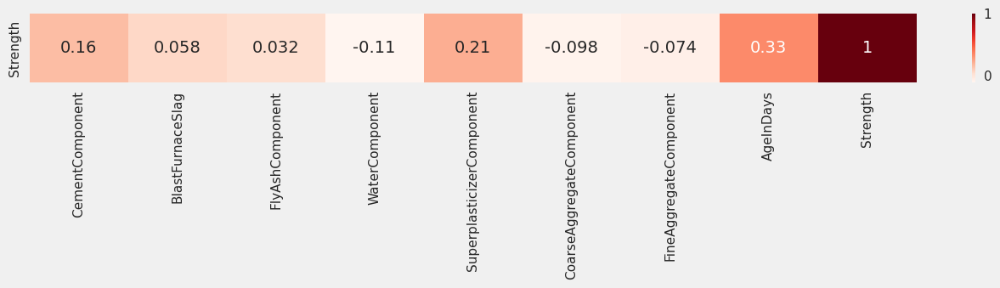

In [9]:
# Pearson Corrleation Matrix
%matplotlib inline
plt.figure(figsize = (15,1))
pea = train.corr(method='pearson').tail(1)
sns.heatmap( pea, cmap = 'Reds' ,annot=True)

<AxesSubplot:>

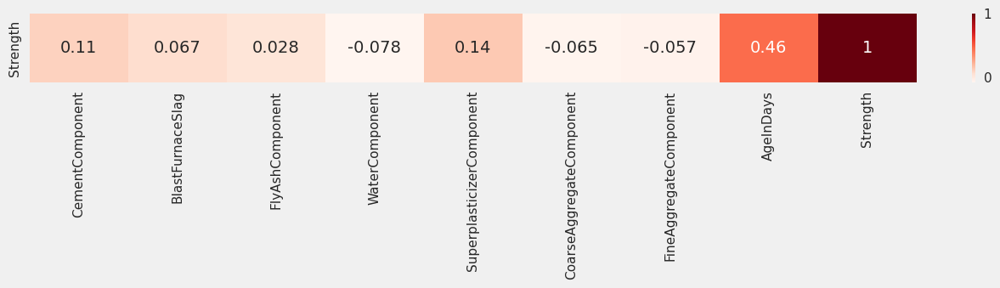

In [10]:
# kendall Corrleation Matrix
%matplotlib inline
plt.figure(figsize = (15,1))
ken = train.corr(method='kendall').tail(1)
sns.heatmap( ken, cmap = 'Reds' ,annot=True)

# 7. Plots

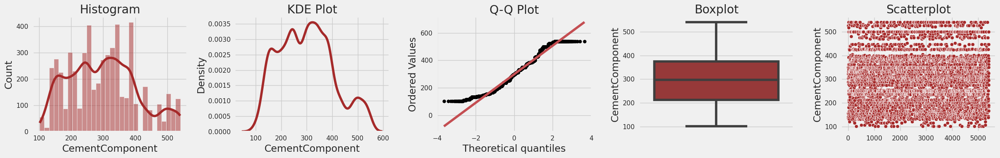

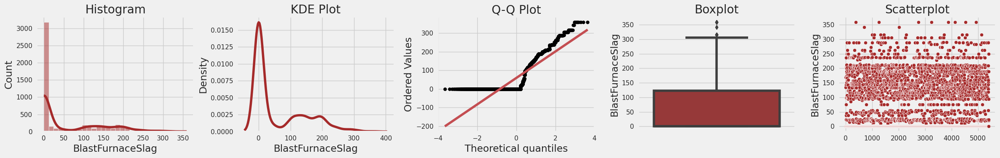

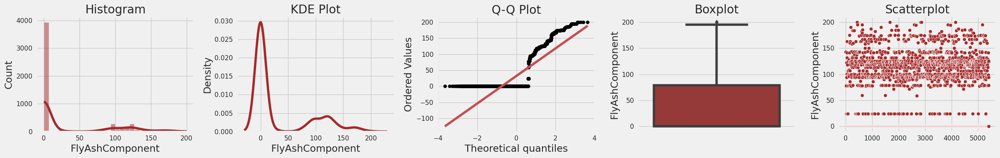

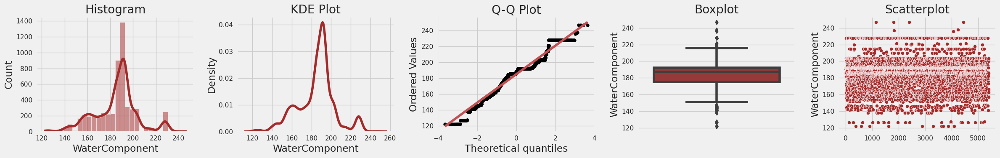

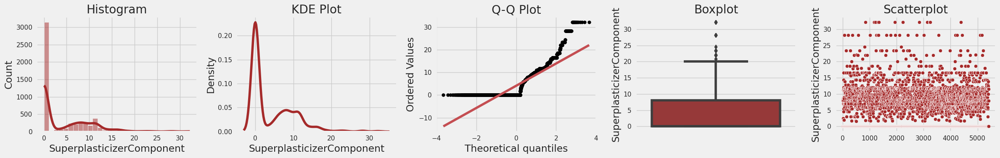

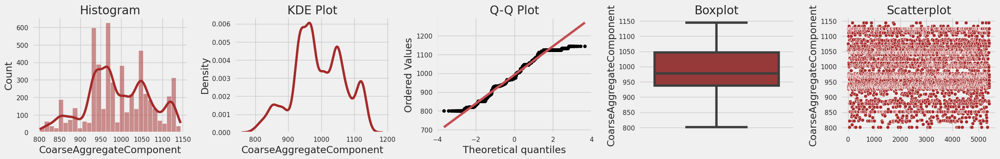

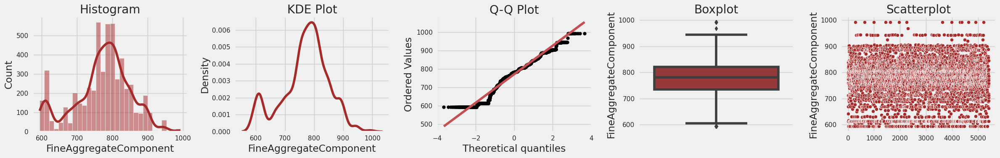

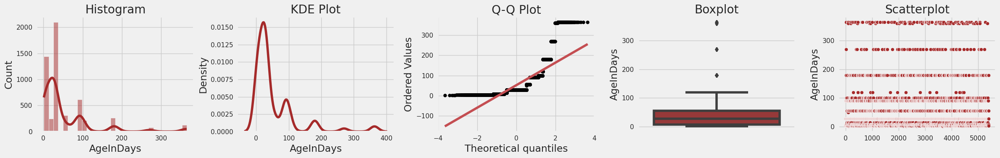

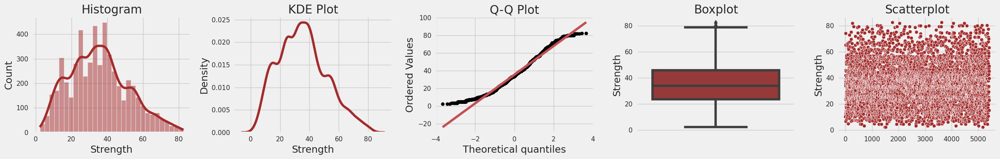

In [11]:
%matplotlib inline
def plots(df, variable):
    # define figure size
    fig, ax = plt.subplots(1, 5, figsize=(24, 4))
    
    # histogram
    sns.histplot(df[variable], bins=30, kde=True, ax=ax[0] ,color='Brown')
    ax[0].set_title('Histogram')
    
    # KDE plot
    sns.kdeplot(df[variable], ax=ax[1] ,color = 'Brown')
    ax[1].set_title('KDE Plot')
    
    # Q-Q plots
    stats.probplot(df[variable], dist="norm", plot=ax[2] )
    ax[2].lines[0].set_color('brown')
    ax[2].lines[0].set_color('Black')
    ax[2].set_title('Q-Q Plot')
    
    
    # boxplot
    sns.boxplot(y=df[variable], ax=ax[3] ,color = 'Brown')
    ax[3].set_title('Boxplot')
    
    # scatterplot
    sns.scatterplot(x=df.index, y=df[variable], ax=ax[4] ,color = 'Brown')
    ax[4].set_title('Scatterplot')
    
    plt.tight_layout()
    plt.show()

for i in train.columns:
    plots(train ,i)

# 8. Detecting outliers percentage

In [12]:
def detect_outliers(data):
    outlier_percents = {}
    for column in data.columns:
        q1 = np.quantile(data[column], 0.25)
        q3 = np.quantile(data[column], 0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
        outlier_percent = (outliers.shape[0] / data.shape[0]) * 100
        outlier_percents[column] = outlier_percent
        
    outlier_dataframe = pd.DataFrame(data = outlier_percents.values() ,index=outlier_percents.keys() ,columns=['Outlier_percentage'])
    
    return outlier_dataframe.sort_values(by = 'Outlier_percentage').style.background_gradient(cmap='Reds')


detect_outliers(train)


,Outlier_percentage
CementComponent,0.000000
CoarseAggregateComponent,0.000000
FlyAshComponent,0.092473
BlastFurnaceSlag,0.388385
Strength,0.610320
SuperplasticizerComponent,1.387091
FineAggregateComponent,2.829665
AgeInDays,8.636952
WaterComponent,8.932865


# 9. Skewness Check

In [13]:
def skew(col):
    if ((col < 0.5) & (col > -0.5)):
        return "Normally Distributed"
    elif ((col<1) & (col > 0.5)):
        return "Positively skewed"
    elif (col<-0.5) & (col>-1 ):
        return "Negatively Skewed"
    elif (col < -1):
        return "Highly Negatively Skewed - Do Sqaure Root Transformation"
    elif (col>1):
        return "Highly Positively Skewed - Do Log Transform"
    

skew_data = pd.DataFrame(train.skew() , columns=['Skewness'])
skew_data['Remark'] = skew_data['Skewness'].apply(lambda x : skew(x))


In [14]:
skew_data.style.background_gradient(cmap='Reds')

,Skewness,Remark
CementComponent,0.341278,Normally Distributed
BlastFurnaceSlag,1.121204,Highly Positively Skewed - Do Log Transform
FlyAshComponent,1.304692,Highly Positively Skewed - Do Log Transform
WaterComponent,-0.215282,Normally Distributed
SuperplasticizerComponent,1.411689,Highly Positively Skewed - Do Log Transform
CoarseAggregateComponent,-0.081453,Normally Distributed
FineAggregateComponent,-0.447378,Normally Distributed
AgeInDays,2.746870,Highly Positively Skewed - Do Log Transform
Strength,0.380732,Normally Distributed


# 10. Handling Skewness

In [15]:
# log_tra_list = ['BlastFurnaceSlag' ,'FlyAshComponent' ,'SuperplasticizerComponent' ,'AgeInDays']
# for i in log_tra_list:
#     train[i] = np.log1p(train[i])

# 11. Feature selection 
>1. VIF - (Variance Inflation Factor)
>2. IG  - (Information Gain)
>3. FS  - (Fisher Score)

<AxesSubplot:>

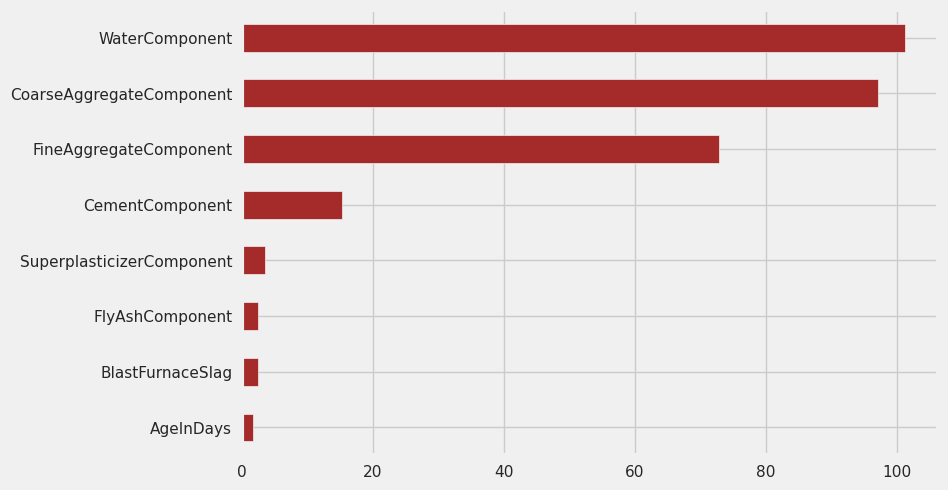

In [16]:
# Multicollinearity test
# VIF - (Variance Inflation Factor)
X = train.drop('Strength' ,axis =1)
y = train['Strength']
vif_list = []
for i in range(len(X.columns)):
    vif = variance_inflation_factor(X.to_numpy() , i)
    vif_list.append(vif)
    
series = pd.Series(vif_list , index = X.columns)
series.sort_values().plot(kind='barh' , color= 'Brown')
# Above 5% values having Multicollinearity we have to remove this---

<AxesSubplot:>

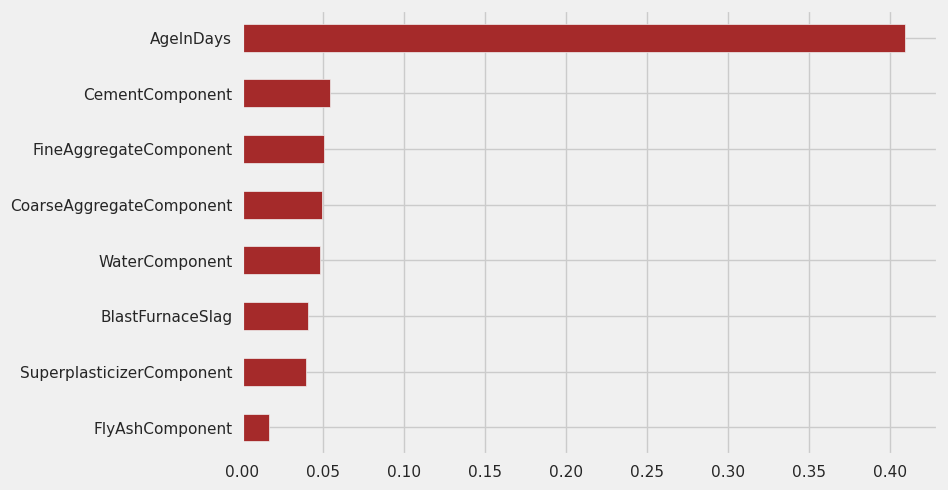

In [17]:
# Information gain
X = train.drop('Strength' ,axis =1)
y = train['Strength']

IG = mutual_info_regression(X,y)
series = pd.Series(IG , index = X.columns)
series.sort_values().plot(kind='barh' ,color = 'brown')
# measures the dependency between variables ,larger numbers indicate greater dependency

# 12. Model building

In [18]:
X = train.drop('Strength' ,axis =1)
y = train['Strength']


In [19]:
models = []
k_fold = KFold(n_splits=5, shuffle=True,random_state=42) 
model_list = ["GradientBoostingRegressor" ,"XGBRegressor",'CatBoostRegressor' , "LGBMRegressor"]
for model in model_list:
    print(model)
    print("*"*70)    
    if model in ["GradientBoostingRegressor" ,"XGBRegressor", "LGBMRegressor"]:
        model = eval(model)
        for i , (train_index, test_index) in enumerate(k_fold.split(X, y)):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            model_ = model()
            model_.fit(X_train,y_train)
            pred = model_.predict(X_test)
            models.append(model_)
            rmse = np.sqrt(mean_squared_error(y_test , pred))
            print("Fold no:",i ,"and RMSE:" ,rmse)
        print("*"*70)
    else:
        model = eval(model)
        for i , (train_index, test_index) in enumerate(k_fold.split(X, y)):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            model_ = model(verbose=0)
            model_.fit(X_train,y_train)
            pred = model_.predict(X_test)
            models.append(model_)
            rmse = np.sqrt(mean_squared_error(y_test , pred))
            print("Fold no:",i ,"and RMSE:" ,rmse)
        print("*"*70)        

GradientBoostingRegressor
**********************************************************************
Fold no: 0 and RMSE: 11.780322462500061
Fold no: 1 and RMSE: 12.05760266165236
Fold no: 2 and RMSE: 12.250991476460808
Fold no: 3 and RMSE: 12.111849418123903
Fold no: 4 and RMSE: 12.414447898157727
**********************************************************************
XGBRegressor
**********************************************************************
Fold no: 0 and RMSE: 12.655941494057421
Fold no: 1 and RMSE: 12.776357749091682
Fold no: 2 and RMSE: 12.936597677253467
Fold no: 3 and RMSE: 13.108004995590896
Fold no: 4 and RMSE: 13.369412140575188
**********************************************************************
CatBoostRegressor
**********************************************************************
Fold no: 0 and RMSE: 12.108399527193958
Fold no: 1 and RMSE: 12.26894699785835
Fold no: 2 and RMSE: 12.370315981294425
Fold no: 3 and RMSE: 12.437710007338925
Fold no: 4 and RMSE: 12.524185

# 13. Checking Prediction on additional data

In [20]:
addition_data = pd.read_csv('/kaggle/input/predict-concrete-strength/ConcreteStrengthData.csv')
addition_data.columns = train.columns
add_x = addition_data.drop('Strength' ,axis = 1)
add_y = addition_data.Strength
prediction = {}
for pred , model in enumerate(models):
    prediction[pred] = model.predict(add_x)
      
# There are total 20 prediction
addition_pred = pd.DataFrame(data = prediction )

In [21]:
addition_pred.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,42.612175,44.677802,43.023296,46.596955,42.641243,28.488754,40.384888,41.977379,52.695427,40.893597,35.172199,40.577339,41.616599,46.425163,40.177143,36.545293,41.585783,40.240263,45.752978,38.706514
1,45.118977,44.677802,44.021791,46.114515,42.641243,29.997967,41.590572,41.645851,48.024113,41.198582,36.975960,40.646015,43.737864,46.379073,40.571913,36.645366,41.716134,41.084811,42.386193,38.088567
2,44.268351,43.728189,45.519608,44.831750,44.944201,40.364941,35.604645,44.280205,40.573593,43.013519,43.233122,38.040641,44.323541,42.386224,44.699504,44.053624,40.236310,45.857810,42.985634,45.782659
3,44.268351,43.728189,44.830320,43.925432,44.944201,46.548916,33.285339,49.925690,42.078598,44.359741,45.687010,38.826638,45.862295,40.850873,44.434761,44.053624,41.132199,46.576612,41.355980,44.286469
4,41.598487,41.124617,42.853199,40.033210,40.946337,45.400826,47.059315,45.048363,45.568512,47.115601,42.914163,46.144438,44.220818,42.179123,43.987058,44.047790,44.908742,46.019156,43.396893,45.450727


In [22]:
addition_pred['final'] = addition_pred.sum(axis=1)
addition_pred['final'] = addition_pred['final']/20

In [23]:
rmse = np.sqrt(mean_squared_error(add_y , addition_pred['final']))
print("The rmse on Additional data:" , rmse)

The rmse on Additional data: 10.01176647830565


# 14. Prediction


In [24]:
sub = pd.read_csv('/kaggle/input/playground-series-s3e9/sample_submission.csv')

In [25]:
prediction = {}
for pred , model in enumerate(models):
    prediction[pred] = model.predict(test)
      
# There are total 20 prediction
test_pred = pd.DataFrame(data = prediction )

test_pred['final'] = test_pred.sum(axis=1)
test_pred['final'] = test_pred['final']/20

sub['Strength'] = test_pred['final']
sub.to_csv('Submission.csv' ,index = False)

In [26]:
# colour combinations is not good, but i try